In [271]:
#importing libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [493]:
rain=pd.read_csv('rainfall.csv')

In [494]:
rain.head()
#the dataset has mixed data of numeric and string
#there are null values present in data set.

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [495]:
rain.shape
#there are total of 8425 rows & 23 columns

(8425, 23)

In [275]:
#Two predictions are required
#1. Rain tomorrow - Logistic Regression
#2.Rainfall amount- Linear Regression

# Performing EDA

In [276]:
#creating a data frame
rain = pd.DataFrame(rain)
rain

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [288]:
#to find the type of the dataset
type(rain)
#the dataset type is data frame

pandas.core.frame.DataFrame

In [289]:
rain.info()
#7 columns have object data type that needs to be converted to numeric 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [290]:
#listing all column names
rain.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [291]:
#checking for null values
rain.isnull().sum()

#there are null values in the following columns

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

<AxesSubplot:>

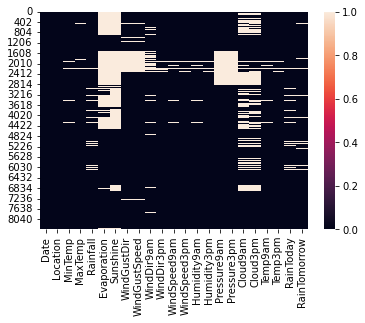

In [292]:
#plotting null values via graph
sns.heatmap(rain.isnull())

#the blank spcaes show that there are null values present

In [293]:
#latitude & longitude
rain['MinTemp'].value_counts()

 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
         ..
 0.3      1
 28.3     1
-1.1      1
-1.4      1
 26.0     1
Name: MinTemp, Length: 285, dtype: int64

In [294]:
rain['MaxTemp'].value_counts()

19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
        ..
11.2     1
43.1     1
42.7     1
42.9     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64

In [295]:
rain['Rainfall'].value_counts()

0.0      5299
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64

In [296]:
rain['Evaporation'].value_counts()

4.0     180
3.0     163
2.4     147
2.2     146
2.6     143
       ... 
17.0      1
18.6      1
22.4      1
19.2      1
0.7       1
Name: Evaporation, Length: 116, dtype: int64

In [297]:
rain['Sunshine'].value_counts()

0.0     166
11.1     68
11.2     67
11.0     66
10.7     64
       ... 
2.5       8
13.6      7
13.8      4
13.9      3
13.5      2
Name: Sunshine, Length: 140, dtype: int64

In [298]:
rain['WindGustDir'].value_counts()


N      713
SSE    578
S      577
SW     572
E      557
WNW    531
W      507
WSW    504
SE     484
ENE    415
SSW    396
NW     383
NE     353
NNE    343
ESE    302
NNW    219
Name: WindGustDir, dtype: int64

In [299]:
m = rain['WindGustDir'].mode()
m

0    N
dtype: object

In [300]:
rain['WindGustSpeed'].value_counts()

39.0     441
35.0     435
37.0     422
33.0     408
31.0     396
41.0     371
30.0     367
28.0     332
43.0     302
48.0     292
26.0     275
50.0     259
46.0     258
24.0     255
52.0     249
44.0     241
22.0     223
54.0     210
20.0     186
56.0     153
57.0     148
19.0     137
61.0     114
59.0     113
63.0      95
17.0      92
65.0      74
67.0      64
72.0      62
15.0      58
13.0      57
74.0      54
70.0      53
69.0      49
76.0      44
78.0      23
80.0      22
11.0      18
85.0      14
81.0      13
91.0      12
93.0       7
89.0       7
83.0       6
9.0        6
98.0       4
94.0       3
87.0       3
7.0        2
102.0      2
100.0      2
107.0      1
Name: WindGustSpeed, dtype: int64

In [301]:
rain['WindDir9am'].value_counts()

N      906
SW     704
NW     625
WSW    543
SE     505
WNW    480
SSW    467
ENE    433
NNE    430
W      414
NE     409
S      402
E      380
SSE    365
NNW    280
ESE    253
Name: WindDir9am, dtype: int64

In [302]:
m = rain['WindDir9am'].mode()
m

0    N
dtype: object

In [303]:
rain['WindDir3pm'].value_counts()

SE     813
S      742
SSE    623
WSW    580
NE     544
N      524
SW     494
WNW    487
NW     468
W      462
ESE    462
E      460
ENE    417
SSW    370
NNE    365
NNW    306
Name: WindDir3pm, dtype: int64

In [304]:
m = rain['WindDir3pm'].mode()
m

0    SE
dtype: object

In [305]:
rain['WindSpeed9am'].value_counts()


9.0     803
0.0     752
13.0    708
4.0     610
11.0    607
7.0     572
6.0     515
17.0    481
15.0    467
19.0    430
20.0    427
24.0    312
22.0    279
2.0     258
28.0    229
26.0    208
31.0    153
30.0    114
35.0     77
33.0     70
37.0     58
41.0     49
39.0     35
44.0     29
43.0     28
46.0     26
52.0     16
50.0     10
56.0      8
54.0      6
48.0      6
61.0      2
57.0      2
63.0      2
Name: WindSpeed9am, dtype: int64

In [306]:
rain['WindSpeed3pm'].value_counts()

9.0     724
19.0    639
13.0    599
20.0    594
17.0    555
11.0    534
15.0    524
24.0    511
28.0    458
22.0    457
26.0    378
7.0     331
4.0     287
30.0    279
31.0    266
6.0     240
0.0     199
33.0    170
35.0    137
37.0    125
39.0     80
2.0      58
41.0     45
43.0     34
46.0     29
44.0     18
50.0     12
48.0     11
52.0      9
56.0      7
54.0      2
61.0      2
57.0      2
65.0      1
83.0      1
Name: WindSpeed3pm, dtype: int64

In [307]:
rain['Humidity9am'].value_counts()


73.0    205
62.0    202
68.0    199
74.0    195
70.0    188
       ... 
17.0      2
14.0      2
11.0      2
10.0      1
15.0      1
Name: Humidity9am, Length: 90, dtype: int64

In [308]:
rain['Humidity3pm'].value_counts()

55.0    195
48.0    194
51.0    194
46.0    193
54.0    193
       ... 
8.0      11
7.0       9
98.0      7
99.0      3
6.0       3
Name: Humidity3pm, Length: 94, dtype: int64

In [309]:
rain['Pressure9am'].value_counts()

1014.8    58
1019.2    55
1016.1    54
1019.6    53
1020.0    49
          ..
1037.3     1
997.8      1
1036.9     1
1036.3     1
1033.6     1
Name: Pressure9am, Length: 384, dtype: int64

In [310]:
rain['Pressure3pm'].value_counts()

1017.8    60
1018.0    57
1019.8    53
1017.9    53
1015.5    52
          ..
982.9      1
994.3      1
998.9      1
1030.0     1
1029.5     1
Name: Pressure3pm, Length: 374, dtype: int64

In [311]:
rain['Cloud9am'].value_counts()

7.0    1418
1.0    1038
8.0    1015
0.0     554
6.0     551
5.0     414
3.0     384
2.0     357
4.0     273
Name: Cloud9am, dtype: int64

In [312]:
rain['Cloud3pm'].value_counts()

7.0    1294
1.0    1077
8.0     863
6.0     597
5.0     522
2.0     508
3.0     411
4.0     351
0.0     347
Name: Cloud3pm, dtype: int64

In [313]:
rain['Temp9am'].value_counts()

14.8    77
18.0    73
18.3    71
17.5    69
20.6    68
        ..
2.5      1
2.0      1
3.4      1
5.2      1
30.2     1
Name: Temp9am, Length: 304, dtype: int64

In [314]:
rain['Temp3pm'].value_counts()

19.2    78
22.5    77
19.0    75
21.7    72
18.5    72
        ..
37.4     1
8.7      1
36.7     1
8.6      1
42.4     1
Name: Temp3pm, Length: 328, dtype: int64

In [315]:
rain['RainToday'].value_counts()

No     6195
Yes    1990
Name: RainToday, dtype: int64

In [316]:
m=rain['RainToday'].mode()
m

0    No
dtype: object

In [317]:
rain['RainTomorrow'].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

In [318]:
m=rain['RainTomorrow'].mode()
m

0    No
dtype: object

In [496]:
#we will fill the missing data with the mean,mode, median
rain['MinTemp'] = rain['MinTemp'].fillna(rain['MinTemp'].mean())
rain['MaxTemp'] = rain['MaxTemp'].fillna(rain['MaxTemp'].mean())
rain['Rainfall'] = rain['Rainfall'].fillna(rain['Rainfall'].mean())
rain['Evaporation'] = rain['Evaporation'].fillna(rain['Evaporation'].mean())
rain['Sunshine'] = rain['Sunshine'].fillna(rain['Sunshine'].mean())
rain['WindGustDir'] = rain['WindGustDir'].fillna(m[0])
rain['WindGustSpeed'] = rain['WindGustSpeed'].fillna(rain['WindGustSpeed'].mean())
rain['WindDir9am'] = rain['WindDir9am'].fillna(m[0])
rain['WindDir3pm'] = rain['WindDir3pm'].fillna(m[0])
rain['WindSpeed9am'] = rain['WindSpeed9am'].fillna(rain['WindSpeed9am'].mean())
rain['WindSpeed3pm'] = rain['WindSpeed3pm'].fillna(rain['WindSpeed3pm'].mean())
rain['Humidity9am'] = rain['Humidity9am'].fillna(rain['Humidity9am'].median())
rain['Humidity3pm'] = rain['Humidity3pm'].fillna(rain['Humidity3pm'].median())
rain['Pressure3pm'] = rain['Pressure3pm'].fillna(rain['Pressure3pm'].median())
rain['Pressure9am'] = rain['Pressure9am'].fillna(rain['Pressure9am'].median())
rain['Cloud9am'] = rain['Cloud9am'].fillna(rain['Cloud9am'].median())
rain['Cloud3pm'] = rain['Cloud3pm'].fillna(rain['Cloud3pm'].median())
rain['Temp9am'] = rain['Temp9am'].fillna(rain['Temp9am'].mean())
rain['Temp3pm'] = rain['Temp3pm'].fillna(rain['Temp3pm'].mean())
rain['RainToday'] = rain['RainToday'].fillna(m[0])
rain['RainTomorrow'] = rain['RainTomorrow'].fillna(m[0])
rain.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [497]:
#checking the updated shape- 7 columns dropped
rain.shape

(8425, 23)

<AxesSubplot:>

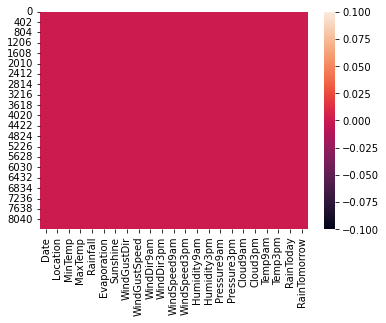

In [321]:
#checking null values via graph
sns.heatmap(rain.isnull())

#all null values removed

In [322]:
rain.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [498]:
#using the ordinal encoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
enc.fit(rain[["Date"]])
rain[["Date"]] = enc.transform(rain[["Date"]])

In [499]:
#Using Label encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [500]:
columns = ['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday','RainTomorrow']
for i in columns:
    rain[i] = le.fit_transform(rain[i])

In [501]:
rain.head()

#now all the data is numeric

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1,13.4,22.9,0.6,5.389395,7.632205,14,44.0,14,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,1.0,1,7.4,25.1,0.0,5.389395,7.632205,15,44.0,6,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,2.0,1,12.9,25.7,0.0,5.389395,7.632205,16,46.0,14,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,3.0,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,10,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,4.0,1,17.5,32.3,1.0,5.389395,7.632205,14,41.0,1,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


In [502]:
rain.describe()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,...,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,1296.570564,5.793591,13.193305,23.859976,2.805913,5.389395,7.632205,8.298398,40.174469,8.219941,...,67.823739,51.246766,1017.649519,1015.246030,4.691157,4.647953,17.762015,22.442934,0.236202,0.236320
std,854.249434,3.162654,5.379488,6.114516,10.309308,3.852004,2.825451,4.857927,13.776101,4.786534,...,16.774237,18.311914,6.275796,6.217494,2.437110,2.310476,5.608301,5.945849,0.424773,0.424846
min,0.000000,0.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,0.000000,7.000000,0.000000,...,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,0.000000,0.000000
25%,589.000000,3.000000,9.300000,19.300000,0.000000,4.000000,7.632205,4.000000,31.000000,4.000000,...,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,0.000000,0.000000
50%,1088.000000,6.000000,13.200000,23.300000,0.000000,5.389395,7.632205,8.000000,40.174469,8.000000,...,68.000000,51.000000,1017.700000,1015.300000,5.000000,5.000000,17.762015,22.000000,0.000000,0.000000
75%,2021.000000,8.000000,17.300000,28.000000,1.400000,5.389395,8.900000,13.000000,48.000000,13.000000,...,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,0.000000,0.000000
max,3003.000000,11.000000,28.500000,45.500000,371.000000,145.000000,13.900000,16.000000,107.000000,16.000000,...,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,1.000000,1.000000


# Target- Rain Tomorrow- Logistic Regression

In [503]:
#We can see that there is some skewness in the columns like- rainfall, evaporation, windgust speed, WindSpeed9am, WindSpeed3pm

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

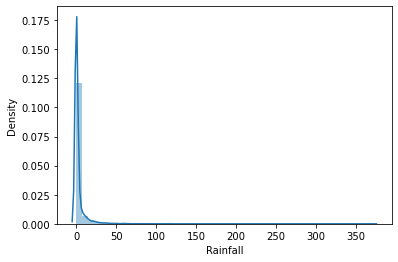

In [504]:
#showing the histogram
sns.distplot(rain["Rainfall"], kde= True)

#the data is highly right skewed

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

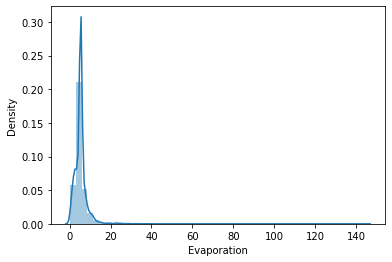

In [330]:
sns.distplot(rain["Evaporation"],kde=True)

#the data is highly right skewed


<AxesSubplot:xlabel='WindGustSpeed', ylabel='Density'>

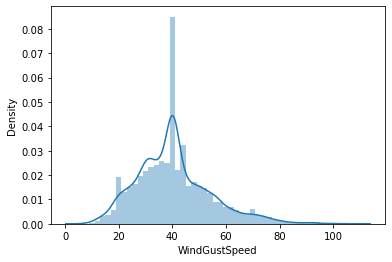

In [331]:
sns.distplot(rain["WindGustSpeed"],kde=True)
#the data is slightly right skewed

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

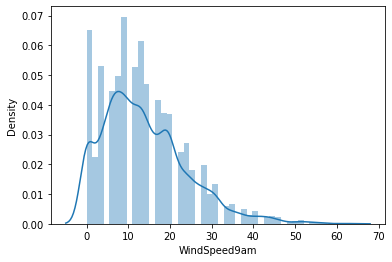

In [332]:
sns.distplot(rain["WindSpeed9am"],kde=True)

#the data is right skewed

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Density'>

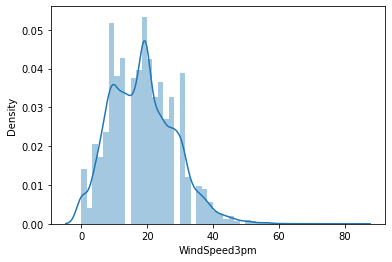

In [333]:
sns.distplot(rain["WindSpeed3pm"],kde=True)
             
#some right skewed

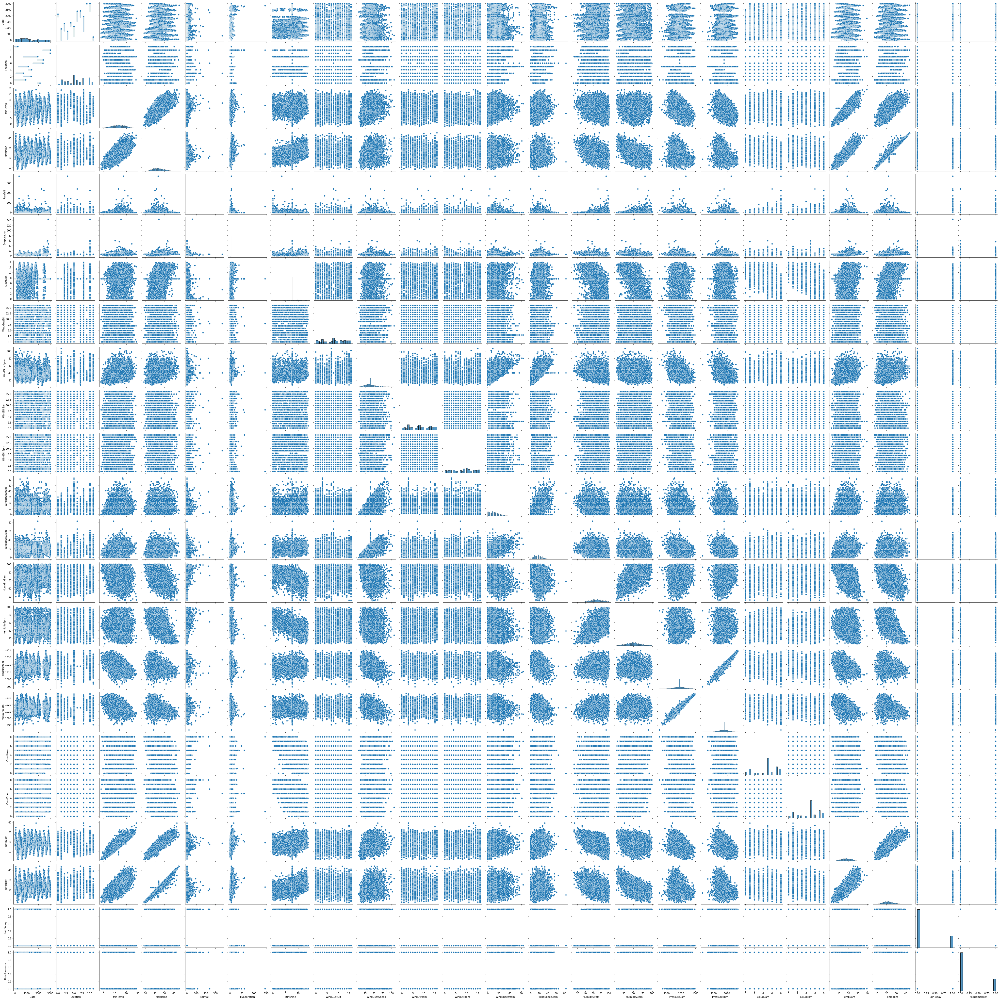

In [53]:
sns.pairplot(rain)

#there is some linear relation between pressure & temp columns.

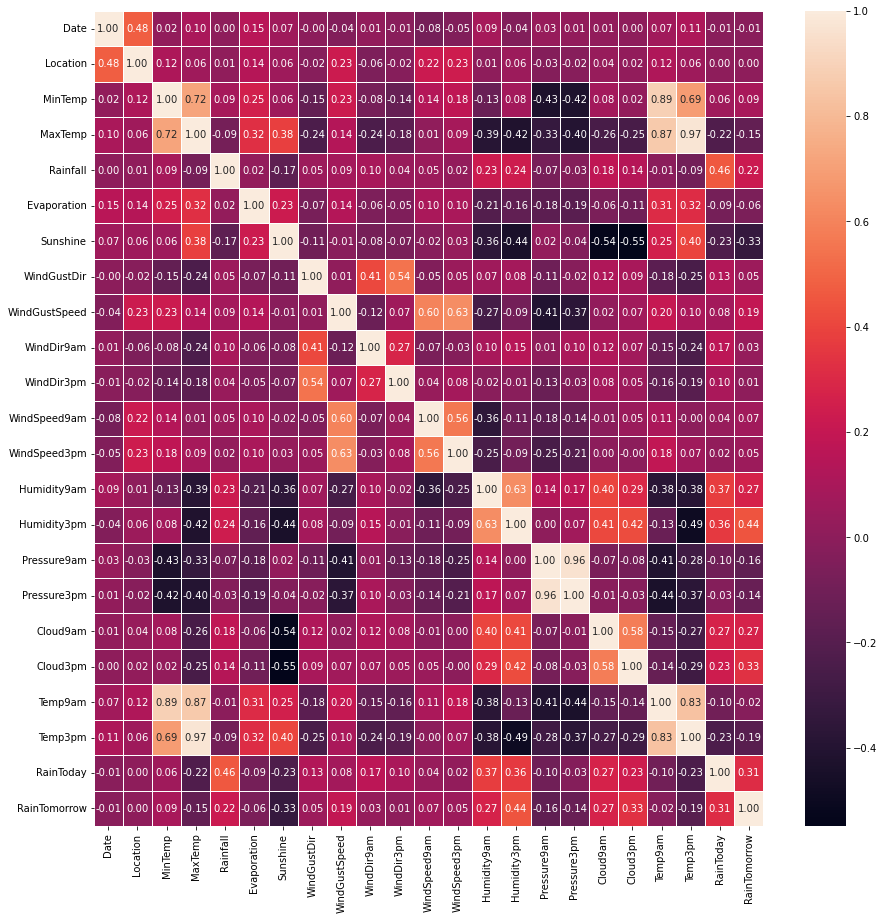

In [505]:
#heatmap for correlation
corr_hmap= rain.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr_hmap, annot=True, linewidths=0.9, linecolor="white", fmt='.2f')
plt.show()

#some findings:
#high positive correlation between min,max temp and temp at 9am and 3pm.
#negative correlation between min,max temp and pressure columns
#negative correlation between sunshine & clouds, humidity columns
#negative correlation between temp and humidity columns
#maximum relation with the "Rain Tomorrow" columns is of Humidity 3pm, cloud 3pm, sunshine

<AxesSubplot:xlabel='MinTemp', ylabel='Temp9am'>

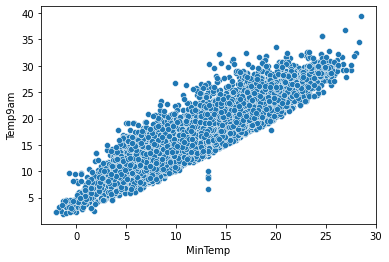

In [335]:
#showing some scatter plots
#scatterplot
sns.scatterplot(x="MinTemp", y="Temp9am", data=rain)

#we can see almost linear relation

<AxesSubplot:xlabel='MinTemp', ylabel='Pressure3pm'>

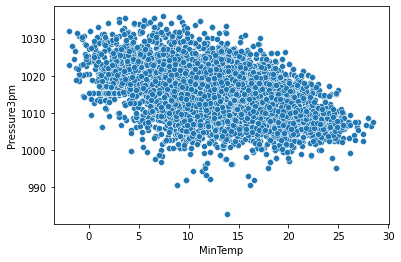

In [336]:
sns.scatterplot(x="MinTemp", y="Pressure3pm", data=rain)

#it is slightly negative linear relation

<AxesSubplot:xlabel='Sunshine', ylabel='Humidity9am'>

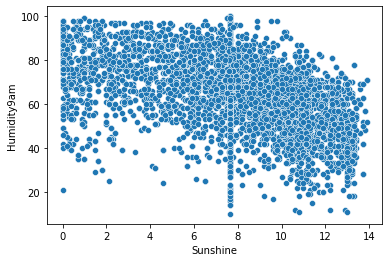

In [337]:
sns.scatterplot(x="Sunshine", y="Humidity9am", data=rain)

#slightly linear negative relation

<AxesSubplot:xlabel='MaxTemp', ylabel='Humidity9am'>

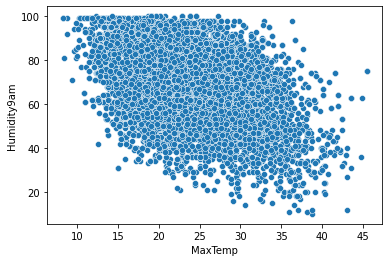

In [338]:
sns.scatterplot(x="MaxTemp", y="Humidity9am", data=rain)
#negative relation, not very linear though

In [339]:
rain.corr()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,1.000000,0.475037,0.016931,0.102409,0.004945,0.153853,0.065101,-0.001723,-0.037361,0.013844,...,0.086361,-0.038467,0.032081,0.014918,0.014491,0.002659,0.070703,0.113734,-0.011365,-0.011228
Location,0.475037,1.000000,0.116531,0.064268,0.007693,0.143519,0.057817,-0.018583,0.231396,-0.056213,...,0.005680,0.055767,-0.031990,-0.020292,0.037747,0.015868,0.118051,0.060570,0.003071,0.002824
MinTemp,0.016931,0.116531,1.000000,0.717522,0.087684,0.254965,0.056184,-0.152398,0.230058,-0.077828,...,-0.130728,0.079107,-0.429667,-0.423244,0.078409,0.022145,0.887119,0.685520,0.064789,0.092942
MaxTemp,0.102409,0.064268,0.717522,1.000000,-0.087451,0.322405,0.378403,-0.236657,0.139998,-0.239999,...,-0.390973,-0.421844,-0.325794,-0.403335,-0.255263,-0.252869,0.866039,0.974506,-0.224883,-0.152886
Rainfall,0.004945,0.007693,0.087684,-0.087451,1.000000,0.023517,-0.169432,0.050772,0.086000,0.096842,...,0.228799,0.235455,-0.072665,-0.033648,0.178932,0.143365,-0.007083,-0.090687,0.461106,0.220021
Evaporation,0.153853,0.143519,0.254965,0.322405,0.023517,1.000000,0.226001,-0.071002,0.136371,-0.055769,...,-0.213109,-0.161659,-0.177786,-0.189557,-0.061732,-0.105846,0.305264,0.315109,-0.088654,-0.059012
Sunshine,0.065101,0.057817,0.056184,0.378403,-0.169432,0.226001,1.000000,-0.107097,-0.013778,-0.079945,...,-0.360836,-0.440269,0.021887,-0.035861,-0.535092,-0.549008,0.250640,0.395324,-0.234230,-0.327731
WindGustDir,-0.001723,-0.018583,-0.152398,-0.236657,0.050772,-0.071002,-0.107097,1.000000,0.013095,0.408316,...,0.066514,0.080483,-0.112583,-0.022243,0.116985,0.093547,-0.184761,-0.250572,0.132956,0.050551
WindGustSpeed,-0.037361,0.231396,0.230058,0.139998,0.086000,0.136371,-0.013778,0.013095,1.000000,-0.124646,...,-0.269592,-0.091869,-0.407483,-0.373021,0.017673,0.069212,0.202298,0.102199,0.076822,0.190127
WindDir9am,0.013844,-0.056213,-0.077828,-0.239999,0.096842,-0.055769,-0.079945,0.408316,-0.124646,1.000000,...,0.095675,0.149521,0.011365,0.098736,0.117334,0.071041,-0.148058,-0.244488,0.165483,0.027267


In [506]:
#making correlation matrix with ''
corr_matrix=rain.corr()
corr_matrix['RainTomorrow'].sort_values(ascending=False)

#the highest correlation with the target variable is of:
#Cloud3pm         0.332197
#RainToday        0.312929
#Humidity9am      0.271231
#Cloud9am         0.270678
#Sunshine        -0.327731

RainTomorrow     1.000000
Humidity3pm      0.444830
Cloud3pm         0.332197
RainToday        0.312929
Humidity9am      0.271231
Cloud9am         0.270678
Rainfall         0.220021
WindGustSpeed    0.190127
MinTemp          0.092942
WindSpeed9am     0.068285
WindSpeed3pm     0.053568
WindGustDir      0.050551
WindDir9am       0.027267
WindDir3pm       0.006512
Location         0.002824
Date            -0.011228
Temp9am         -0.023211
Evaporation     -0.059012
Pressure3pm     -0.135227
MaxTemp         -0.152886
Pressure9am     -0.163972
Temp3pm         -0.193805
Sunshine        -0.327731
Name: RainTomorrow, dtype: float64

In [341]:
rain.shape

(8425, 23)

Date                AxesSubplot(0.125,0.657941;0.0824468x0.222059)
Location         AxesSubplot(0.223936,0.657941;0.0824468x0.222059)
MinTemp          AxesSubplot(0.322872,0.657941;0.0824468x0.222059)
MaxTemp          AxesSubplot(0.421809,0.657941;0.0824468x0.222059)
Rainfall         AxesSubplot(0.520745,0.657941;0.0824468x0.222059)
Evaporation      AxesSubplot(0.619681,0.657941;0.0824468x0.222059)
Sunshine         AxesSubplot(0.718617,0.657941;0.0824468x0.222059)
WindGustDir      AxesSubplot(0.817553,0.657941;0.0824468x0.222059)
WindGustSpeed       AxesSubplot(0.125,0.391471;0.0824468x0.222059)
WindDir9am       AxesSubplot(0.223936,0.391471;0.0824468x0.222059)
WindDir3pm       AxesSubplot(0.322872,0.391471;0.0824468x0.222059)
WindSpeed9am     AxesSubplot(0.421809,0.391471;0.0824468x0.222059)
WindSpeed3pm     AxesSubplot(0.520745,0.391471;0.0824468x0.222059)
Humidity9am      AxesSubplot(0.619681,0.391471;0.0824468x0.222059)
Humidity3pm      AxesSubplot(0.718617,0.391471;0.0824468x0.222

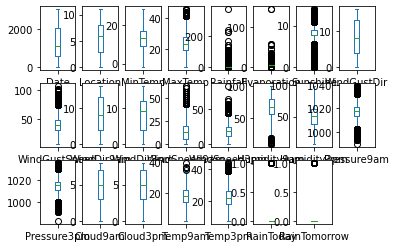

In [507]:
#checking for outliers
rain.plot(kind='box', subplots=True, layout=(3,8))

#there are some outliers present

In [508]:
from scipy.stats import zscore
z=np.abs(zscore(rain))
z.shape

(8425, 23)

In [509]:
threshold=3
print(np.where(z>3))

(array([  12,   12,   44,   44,   52,   52,   60,   60,   61,   61,   62,
         62,   62,   67,   68,   68,  123,  267,  296,  381,  381,  405,
        406,  407,  407,  431,  462,  563,  568,  568,  569,  602,  683,
        683,  699,  713,  748,  748,  770,  796,  797,  802,  928,  935,
        949,  979,  980,  980,  980, 1008, 1009, 1011, 1138, 1148, 1149,
       1151, 1189, 1202, 1203, 1237, 1241, 1264, 1265, 1357, 1411, 1412,
       1413, 1479, 1480, 1481, 1513, 1535, 1587, 1644, 1661, 1665, 1673,
       1680, 1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2063,
       2074, 2108, 2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429,
       2488, 2500, 2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827,
       2835, 2849, 2849, 2855, 2859, 2863, 2869, 2877, 2883, 2890, 2891,
       2897, 2898, 2900, 2901, 2905, 2909, 2911, 2919, 2925, 2933, 2939,
       2947, 2953, 2961, 2967, 2975, 2989, 3003, 3051, 3051, 3058, 3059,
       3059, 3060, 3066, 3067, 3067, 3067, 3068, 3

In [510]:
#total number of outliers presnt are:
len(np.where(z>3)[0])

#there are total 544 outliers present

544

In [511]:
#dropping the outliers
rain_new=rain[(z<3).all(axis=1)]
rain_new

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1,13.4,22.900000,0.6,5.389395,7.632205,14,44.000000,14,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,1.0,1,7.4,25.100000,0.0,5.389395,7.632205,15,44.000000,6,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,2.0,1,12.9,25.700000,0.0,5.389395,7.632205,16,46.000000,14,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,3.0,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,10,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,4.0,1,17.5,32.300000,1.0,5.389395,7.632205,14,41.000000,1,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2999.0,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,10,...,51.0,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,0,0
8421,3000.0,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,10,...,56.0,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,0,0
8422,3001.0,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,10,...,53.0,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,0,0
8423,3002.0,9,7.8,27.000000,0.0,5.389395,7.632205,10,28.000000,11,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0,0


In [347]:
print("old data frame ", rain.shape)
print("new data frame ", rain_new.shape)
print("total dropped rows ", rain.shape[0]- rain_new.shape[0])

old data frame  (8425, 23)
new data frame  (7987, 23)
total dropped rows  438


In [348]:
#data loss percent
loss_percent = ((8425-7987)/8425)*100
loss_percent

#5.19 % data is removed after removing outliers

5.198813056379822

In [349]:
#checking for skewness
rain_new.skew().sort_values(ascending = True)

#the most skewness is present in columns:
#Sunshine        -0.723970
#Cloud9am        -0.504546
#WindGustSpeed    0.506897
#WindSpeed9am     0.711395
#Evaporation      0.846181
#RainTomorrow     1.296077
#RainToday        1.301170
#Rainfall         3.488446

Sunshine        -0.723970
Cloud9am        -0.504546
Cloud3pm        -0.446866
Humidity9am     -0.231895
WindGustDir     -0.142118
WindDir3pm      -0.117557
MinTemp         -0.084549
Location        -0.040284
Temp9am         -0.038035
WindDir9am      -0.035289
Pressure9am      0.015962
Pressure3pm      0.039711
Humidity3pm      0.125670
WindSpeed3pm     0.300109
MaxTemp          0.314510
Temp3pm          0.334170
Date             0.398008
WindGustSpeed    0.506897
WindSpeed9am     0.711395
Evaporation      0.846181
RainTomorrow     1.296077
RainToday        1.301170
Rainfall         3.488446
dtype: float64

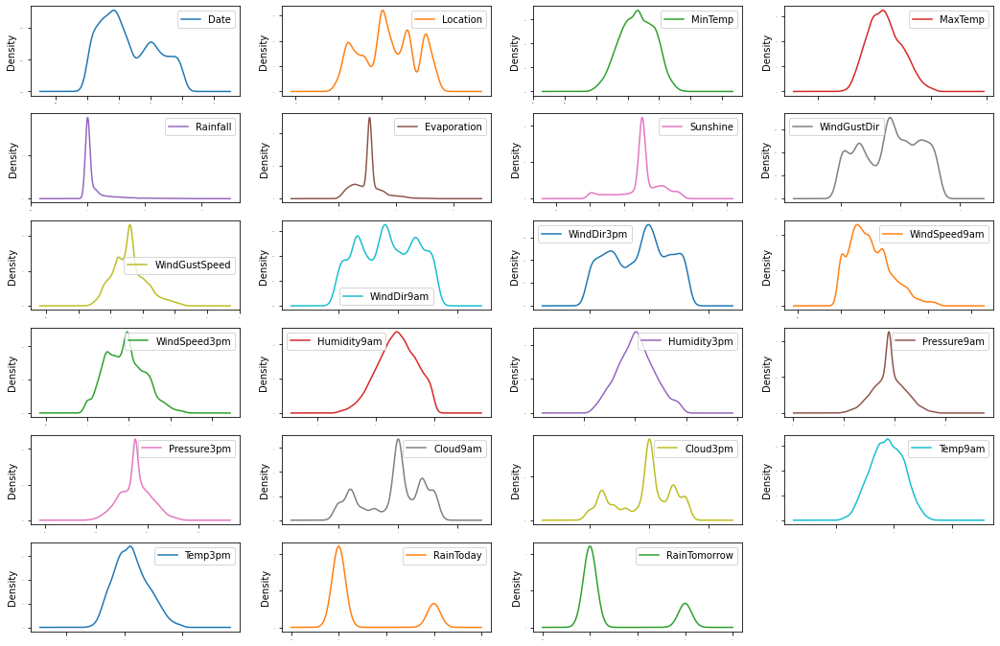

In [350]:
#show skewness using the plot
rain_new.plot(kind='density', subplots=True, layout=(6,4), sharex= False, legend= True, fontsize=1, figsize=(18,12))
plt.show()


#the skewness is present in various columns- rainfall, raintoday, raintomorrow, date etc

In [351]:
#Separating Input & output variables
rain_new.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1,13.4,22.9,0.6,5.389395,7.632205,14,44.0,14,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,1.0,1,7.4,25.1,0.0,5.389395,7.632205,15,44.0,6,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,2.0,1,12.9,25.7,0.0,5.389395,7.632205,16,46.0,14,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,3.0,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,10,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,4.0,1,17.5,32.3,1.0,5.389395,7.632205,14,41.0,1,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


In [352]:
#separating the data set into input & output data
#input data
x= rain_new.iloc[:, :-1]
x.shape

(7987, 22)

In [353]:
y= rain_new.iloc[:, -1:]
y

,RainTomorrow
0,0
1,0
2,0
3,0
4,0
...,...
8420,0
8421,0
8422,0
8423,0


<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

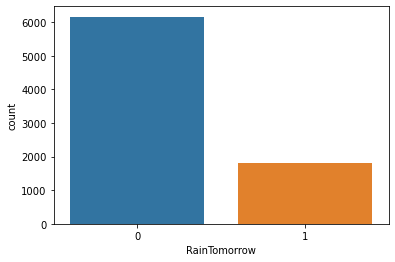

In [354]:
#data balancing
sns.countplot(rain_new['RainTomorrow'])

In [355]:
#target data is not balanced hence performing data balancing
import sklearn

In [356]:
#checking sklearn version
sklearn.__version__

'1.0.2'

In [357]:
from imblearn.over_sampling import SMOTE

In [358]:
smt = SMOTE()
x, y= smt.fit_resample(x, y)

In [359]:
y.value_counts()

RainTomorrow
0               6165
1               6165
dtype: int64

In [360]:
y

#Yes - 1
#No -0

,RainTomorrow
0,0
1,0
2,0
3,0
4,0
...,...
12325,1
12326,1
12327,1
12328,1


In [361]:
#removing the skewness
from sklearn.preprocessing import power_transform
#doing power transform
x=power_transform(x, method='yeo-johnson')
x

array([[-2.48270682, -1.5967903 ,  0.00314248, ..., -0.11038105,
         0.10467259, -0.57504023],
       [-2.45228956, -1.5967903 , -1.13778393, ..., -0.05536587,
         0.52168094, -0.57504023],
       [-2.42885302, -1.5967903 , -0.09155765, ...,  0.63620355,
         0.34146474, -0.57504023],
       ...,
       [ 0.56525421,  0.73647798, -0.83105189, ...,  0.09198097,
        -0.31770872, -0.57504023],
       [-1.66185862,  1.59223117,  0.29509772, ..., -0.16944348,
        -0.40224926,  1.73900875],
       [-1.70846643, -0.8507238 ,  1.19106944, ...,  0.8238438 ,
         0.46751112,  1.73900875]])

In [362]:
#performing data scaling 
from sklearn.preprocessing import StandardScaler
scale= StandardScaler()
x= scale.fit_transform(x)

In [363]:
from sklearn.preprocessing import MinMaxScaler
scale= MinMaxScaler()
scaled=scale.fit_transform(x)
x=scaled
x

array([[0.        , 0.11924595, 0.51492827, ..., 0.47867818, 0.55834579,
        0.        ],
       [0.0073616 , 0.11924595, 0.31739944, ..., 0.48780483, 0.62920205,
        0.        ],
       [0.01303373, 0.11924595, 0.49853282, ..., 0.60253155, 0.59858049,
        0.        ],
       ...,
       [0.73766929, 0.76365538, 0.37050402, ..., 0.51224868, 0.48657657,
        0.        ],
       [0.19866216, 1.        , 0.56547455, ..., 0.46888012, 0.4722118 ,
        1.        ],
       [0.18738211, 0.32529696, 0.72059433, ..., 0.63365981, 0.61999775,
        1.        ]])

In [364]:
#number of columns
x.shape[1] 

22

In [365]:
#checking the multicollieanrity
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [366]:
#finding vif for each column
def calc_vif(x):
    vif= pd.DataFrame()
    vif['variables']=x.columns
    vif['VIF Factor']= [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    return(vif)

In [367]:
x.shape

(12330, 22)

In [368]:
calc_vif(rain_new)

#there is high multicolinearity in columns :


,variables,VIF Factor
0,Date,4.881939
1,Location,6.700045
2,MinTemp,59.294909
3,MaxTemp,437.968997
4,Rainfall,2.289987
5,Evaporation,9.084126
6,Sunshine,16.790346
7,WindGustDir,6.492451
8,WindGustSpeed,22.850998
9,WindDir9am,5.386782


In [370]:
#clubbing the columns to 18 total- clubbing pair of columns with high colinearity 
from sklearn.decomposition import PCA
pca= PCA(n_components= 18)
xpca=pca.fit_transform(x)
x=xpca

In [371]:
x=pd.DataFrame(x)
x.shape

(12330, 18)

In [372]:
y.shape

(12330, 1)

# Target: Rain Tomorrow- Logistic Regression

In [373]:
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [374]:
from sklearn.model_selection import train_test_split

In [375]:
lr= LogisticRegression()

In [383]:
#finding the best accuracy
best_accuracy=0
best_rs= 0
for i in range(1,1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.20, random_state=i)
    lr= LogisticRegression()
    lr.fit(x_train, y_train)
    pred_test= lr.predict(x_test)
    accuracy= accuracy_score(y_test, pred_test)
    if accuracy>best_accuracy:
        best_accuracy=accuracy
        best_rs=i
print("Best Accuracy is ", best_accuracy, "on random state ", best_rs)

#the best accuracy found at random state = 943

Best Accuracy is  0.8203568532035685 on random state  943


Model Training & Predicting

In [384]:
x_train,x_test,y_train, y_test = train_test_split(x,y,test_size=.20, random_state= 943)
lr.fit(x_train, y_train)
pred_train=lr.predict(x_train)
pred_test=lr.predict(x_test)

In [385]:
from sklearn.metrics import classification_report
print("accuracy score:", accuracy_score(y_test, pred_test))
print(classification_report(y_test, pred_test))

accuracy score: 0.8203568532035685
              precision    recall  f1-score   support

           0       0.83      0.82      0.82      1256
           1       0.81      0.82      0.82      1210

    accuracy                           0.82      2466
   macro avg       0.82      0.82      0.82      2466
weighted avg       0.82      0.82      0.82      2466



In [386]:
#The model accuracy is 82%

Cross Validation

In [387]:
pred_lr = lr.predict(x_test)
from sklearn.model_selection import cross_val_score
lss = accuracy_score(y_test, pred_test)
for j in range(2,10):
    lsscore=cross_val_score(lr,x,y,cv=j)
    lsc=lsscore.mean()
    print("At cv: ", j)
    print("Cross validation is ", lsc*100)
    print("accuracy score is ", lss*100)
    print("\n")


At cv:  2
Cross validation is  74.72830494728304
accuracy score is  82.03568532035686


At cv:  3
Cross validation is  73.99837793998377
accuracy score is  82.03568532035686


At cv:  4
Cross validation is  74.35599874381775
accuracy score is  82.03568532035686


At cv:  5
Cross validation is  74.882400648824
accuracy score is  82.03568532035686


At cv:  6
Cross validation is  73.71451743714518
accuracy score is  82.03568532035686


At cv:  7
Cross validation is  76.05940910049802
accuracy score is  82.03568532035686


At cv:  8
Cross validation is  76.57004480221123
accuracy score is  82.03568532035686


At cv:  9
Cross validation is  76.78832116788323
accuracy score is  82.03568532035686




In [388]:
#since the most matching value is at cv= 9, we take it
lsscore_selected= cross_val_score(lr,x,y,cv=9).mean()
print("the cv score is:", lsscore_selected, "the accuracy score is: ", lss)

the cv score is: 0.7678832116788322 the accuracy score is:  0.8203568532035685


AUC ROC curve

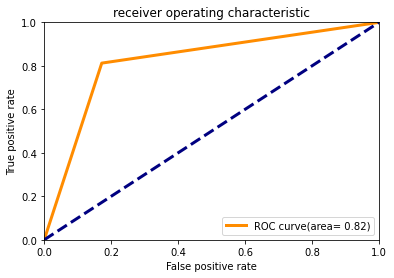

In [389]:
#plotting model performance
from sklearn.metrics import roc_curve, auc
fpr,tpr,thresholds = roc_curve ( pred_test, y_test)
roc_auc= auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color = 'darkorange', lw=3, label= 'ROC curve(area= %0.2f)' % roc_auc)
plt.plot([0,1],[0,1], color='navy', lw=3, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("receiver operating characteristic")
plt.legend(loc="lower right")
plt.show()

In [390]:
#roc area shows that the accuracy is 82%. 

In [391]:
#predicting the "Rain tomorrow" by giving set of inputs
t= np.array([1, 12, 48, 34, 57.89, 7, 2, 34,26,78,98,1,23,4,45,23,31,0])

In [392]:
t.shape

(18,)

In [393]:
t=t.reshape(1,-1)

In [394]:
t.shape

(1, 18)

In [396]:
lr.predict(t)
#The predicted value of 'rain tomorrow' for the given set of input values = 0 ie No

array([0])

Saving the model

In [397]:
#saving Data Frame
project_rain=pd.DataFrame(pred_test)
project_rain.to_csv("poject_rain.csv")

In [398]:
#saving model
import pickle

file_rain = 'poject_rain.pkl'
pickle.dump(lr, open(file_rain, 'wb'))

In [399]:
#load model from disk
model_lr = pickle.load(open(file_rain, 'rb'))

In [400]:
#model prediction
result_lr = model_lr.score(x_test, y_test)
print(result_lr)

#Prediction is correct upto 82%

0.8203568532035685


# Keeping 'rainfall' as the target- Regression Model

# Modelling - Linear Regression

In [512]:
#Separating Input & output variables
rain_new.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,0.0,1,13.4,22.9,0.6,5.389395,7.632205,14,44.0,14,...,71.0,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0,0
1,1.0,1,7.4,25.1,0.0,5.389395,7.632205,15,44.0,6,...,44.0,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0,0
2,2.0,1,12.9,25.7,0.0,5.389395,7.632205,16,46.0,14,...,38.0,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0,0
3,3.0,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,10,...,45.0,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0,0
4,4.0,1,17.5,32.3,1.0,5.389395,7.632205,14,41.0,1,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0,0


In [513]:
rain_new.corr()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,1.000000,0.469427,0.012806,0.102884,0.010500,0.118910,0.055403,-0.008032,-0.031360,-0.004796,...,0.094056,-0.036943,0.040824,0.021362,0.015519,0.012837,0.067969,0.115762,-0.008403,-0.003201
Location,0.469427,1.000000,0.116694,0.063798,0.022192,0.132245,0.048579,-0.020692,0.245658,-0.071132,...,0.003746,0.059951,-0.023952,-0.011962,0.041688,0.025405,0.118100,0.060707,0.002934,0.009222
MinTemp,0.012806,0.116694,1.000000,0.718598,0.093118,0.372576,0.065682,-0.161451,0.231097,-0.081228,...,-0.126378,0.090268,-0.433372,-0.428213,0.075738,0.019920,0.888690,0.687570,0.061728,0.091021
MaxTemp,0.102884,0.063798,0.718598,1.000000,-0.138415,0.468786,0.387050,-0.247967,0.136337,-0.242543,...,-0.382682,-0.409521,-0.333643,-0.414440,-0.254170,-0.251537,0.864864,0.974957,-0.219747,-0.149708
Rainfall,0.010500,0.022192,0.093118,-0.138415,1.000000,-0.095749,-0.166857,0.094508,0.093945,0.131760,...,0.297053,0.290493,-0.104991,-0.043887,0.216815,0.180157,-0.033343,-0.146935,0.689452,0.270580
Evaporation,0.118910,0.132245,0.372576,0.468786,-0.095749,1.000000,0.369080,-0.113753,0.200769,-0.113869,...,-0.325317,-0.231478,-0.261877,-0.275540,-0.114367,-0.144446,0.439628,0.454352,-0.163847,-0.089365
Sunshine,0.055403,0.048579,0.065682,0.387050,-0.166857,0.369080,1.000000,-0.106376,0.009797,-0.080890,...,-0.366344,-0.437502,-0.004098,-0.063855,-0.529443,-0.544184,0.261680,0.403489,-0.219089,-0.317675
WindGustDir,-0.008032,-0.020692,-0.161451,-0.247967,0.094508,-0.113753,-0.106376,1.000000,0.010297,0.407744,...,0.061162,0.077670,-0.098603,-0.005929,0.114354,0.093980,-0.192439,-0.259535,0.127763,0.043425
WindGustSpeed,-0.031360,0.245658,0.231097,0.136337,0.093945,0.200769,0.009797,0.010297,1.000000,-0.120250,...,-0.263928,-0.085022,-0.377620,-0.336491,0.006822,0.052852,0.198936,0.101786,0.076677,0.181478
WindDir9am,-0.004796,-0.071132,-0.081228,-0.242543,0.131760,-0.113869,-0.080890,0.407744,-0.120250,1.000000,...,0.081249,0.142990,0.017068,0.105216,0.110949,0.071791,-0.146485,-0.246836,0.156453,0.022432


In [514]:
corr_matrix=rain.corr()
corr_matrix['Rainfall'].sort_values(ascending=False)

Rainfall         1.000000
RainToday        0.461106
Humidity3pm      0.235455
Humidity9am      0.228799
RainTomorrow     0.220021
Cloud9am         0.178932
Cloud3pm         0.143365
WindDir9am       0.096842
MinTemp          0.087684
WindGustSpeed    0.086000
WindGustDir      0.050772
WindSpeed9am     0.050631
WindDir3pm       0.040557
WindSpeed3pm     0.024791
Evaporation      0.023517
Location         0.007693
Date             0.004945
Temp9am         -0.007083
Pressure3pm     -0.033648
Pressure9am     -0.072665
MaxTemp         -0.087451
Temp3pm         -0.090687
Sunshine        -0.169432
Name: Rainfall, dtype: float64

In [515]:
#dropping columns with least correlation
rain_new = rain_new.drop(['Date', 'Temp9am'], axis=1)

In [516]:
rain_new.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp3pm',
       'RainToday', 'RainTomorrow'],
      dtype='object')

In [517]:
#separating the data set into input & output data
#input data
x= pd.DataFrame(rain, columns=['Location', 'MinTemp', 'MaxTemp','Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp3pm', 'RainToday', 'RainTomorrow'])
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.900000,5.389395,7.632205,14,44.000000,14,15,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,21.8,0,0
1,1,7.4,25.100000,5.389395,7.632205,15,44.000000,6,16,4.0,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,24.3,0,0
2,1,12.9,25.700000,5.389395,7.632205,16,46.000000,14,16,19.0,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,23.2,0,0
3,1,9.2,28.000000,5.389395,7.632205,4,24.000000,10,0,11.0,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,26.5,0,0
4,1,17.5,32.300000,5.389395,7.632205,14,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,5.389395,7.632205,0,31.000000,10,1,13.0,11.0,51.0,24.0,1024.6,1020.3,5.0,5.0,22.4,0,0
8421,9,3.6,25.300000,5.389395,7.632205,6,22.000000,10,3,13.0,9.0,56.0,21.0,1023.5,1019.1,5.0,5.0,24.5,0,0
8422,9,5.4,26.900000,5.389395,7.632205,3,37.000000,10,15,9.0,9.0,53.0,24.0,1021.0,1016.8,5.0,5.0,26.1,0,0
8423,9,7.8,27.000000,5.389395,7.632205,10,28.000000,11,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,26.0,0,0


In [518]:
y=pd.DataFrame(rain, columns= ["Rainfall"])
y

,Rainfall
0,0.6
1,0.0
2,0.0
3,0.0
4,1.0
...,...
8420,0.0
8421,0.0
8422,0.0
8423,0.0


In [519]:
#removing the skewness
from sklearn.preprocessing import power_transform
#doing power transform
x=power_transform(x, method='yeo-johnson')
x

array([[-1.57286976,  0.04112367, -0.07714138, ..., -0.02721805,
        -0.55609919, -0.55628212],
       [-1.57286976, -1.07628109,  0.28034646, ...,  0.38526239,
        -0.55609919, -0.55628212],
       [-1.57286976, -0.05171292,  0.3743678 , ...,  0.20714517,
        -0.55609919, -0.55628212],
       ...,
       [ 1.00253169, -1.45084117,  0.55830718, ...,  0.66632192,
        -0.55609919, -0.55628212],
       [ 1.00253169, -1.00152086,  0.5733979 , ...,  0.65102678,
        -0.55609919, -0.55628212],
       [ 1.00253169,  0.31938327,  0.08141189, ..., -0.18278818,
        -0.55609919, -0.55628212]])

In [520]:
#performing data scaling 
from sklearn.preprocessing import StandardScaler
scale= StandardScaler()
x= scale.fit_transform(x)

In [521]:
from sklearn.preprocessing import MinMaxScaler
scale= MinMaxScaler()
scaled=scale.fit_transform(x)
x=scaled
x

array([[0.11371617, 0.5099961 , 0.52188384, ..., 0.52293933, 0.        ,
        0.        ],
       [0.11371617, 0.31362034, 0.57910568, ..., 0.5883656 , 0.        ,
        0.        ],
       [0.11371617, 0.49368074, 0.59415536, ..., 0.56011324, 0.        ,
        0.        ],
       ...,
       [0.83948403, 0.24779414, 0.6235979 , ..., 0.63294632, 0.        ,
        0.        ],
       [0.83948403, 0.32675891, 0.62601342, ..., 0.63052026, 0.        ,
        0.        ],
       [0.83948403, 0.5588982 , 0.54726291, ..., 0.49826332, 0.        ,
        0.        ]])

In [522]:
#number of columns
x.shape[1] 

20

In [523]:
#checking the multicollieanrity
import statsmodels.api as sm
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [524]:
#finding vif for each column
def calc_vif(x):
    vif= pd.DataFrame()
    vif['variables']=x.columns
    vif['VIF Factor']= [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
    return(vif)

In [525]:
x.shape

(8425, 20)

In [526]:
calc_vif(rain_new)

#there is high multicolinearity in columns : humidity, pressure, max temp

,variables,VIF Factor
0,Location,4.975008
1,MinTemp,35.146034
2,MaxTemp,426.485167
3,Rainfall,2.288899
4,Evaporation,8.983895
5,Sunshine,16.732622
6,WindGustDir,6.481029
7,WindGustSpeed,22.653186
8,WindDir9am,5.357798
9,WindDir3pm,6.084791


In [527]:
#clubbing the columns to 19 total- clubbing pair of columns with high colinearity 
from sklearn.decomposition import PCA
pca= PCA(n_components= 19)
xpca=pca.fit_transform(x)
x=xpca

In [528]:
x=pd.DataFrame(x)
x.shape

(8425, 19)

In [529]:
y.shape

(8425, 1)

In [530]:
#importing the libraries
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

from sklearn.linear_model import Lasso, Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVR

from sklearn.metrics import accuracy_score, confusion_matrix, classification_report



In [531]:
lm=LinearRegression()

In [532]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state=42)

In [533]:
x_train.shape

(5897, 19)

In [534]:
x_test.shape

(2528, 19)

In [535]:
y_train.shape

(5897, 1)

In [536]:
y_test.shape

(2528, 1)

In [537]:
lm.fit(x_train, y_train) 

LinearRegression()

In [538]:
lm.coef_

array([[  6.81768138,   0.35430159,   7.56599317,   0.05830071,
         -0.7257965 ,   1.31890026,  -1.0559426 ,   0.24940239,
         -0.68796957,   0.38258472,   1.74964775,   0.51477377,
         -1.83449194,   3.35321114,   2.94313367,  -4.80355507,
          8.6770839 ,  -4.75711091, -12.86063604]])

In [539]:
lm.intercept_

array([2.7243194])

In [540]:
lm.score(x_train, y_train)

#accuracy of model is 28.42% which is low accuracy

0.28425721104315893

In [541]:
predlm=lm.predict(x_test)

In [542]:
print("predicted wins:", predlm)
print("actual wins: ", y_test)

predicted wins: [[ 1.55032524]
 [ 1.85854179]
 [-0.90301385]
 ...
 [-1.91620256]
 [ 1.07392966]
 [ 0.83096847]]
actual wins:        Rainfall
3862       0.0
1197       0.0
2006       0.0
6839       0.0
7395       0.0
...        ...
5688       0.2
2488      37.6
7442       0.0
2966       0.0
2748       0.2

[2528 rows x 1 columns]


In [543]:
print('The Error:')
print("mean absolute error:", mean_absolute_error(y_test,predlm))
print("mean squared error:", mean_squared_error(y_test,predlm))
print("root mean square error:", np.sqrt(mean_squared_error(y_test,predlm)))

The Error:
mean absolute error: 3.1487862825854918
mean squared error: 128.64063164176315
root mean square error: 11.341985348331356


In [544]:
rain_new.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,RainTomorrow
0,1,13.4,22.9,0.6,5.389395,7.632205,14,44.0,14,15,...,24.0,71.0,22.0,1007.7,1007.1,8.0,5.0,21.8,0,0
1,1,7.4,25.1,0.0,5.389395,7.632205,15,44.0,6,16,...,22.0,44.0,25.0,1010.6,1007.8,5.0,5.0,24.3,0,0
2,1,12.9,25.7,0.0,5.389395,7.632205,16,46.0,14,16,...,26.0,38.0,30.0,1007.6,1008.7,5.0,2.0,23.2,0,0
3,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,10,0,...,9.0,45.0,16.0,1017.6,1012.8,5.0,5.0,26.5,0,0
4,1,17.5,32.3,1.0,5.389395,7.632205,14,41.0,1,7,...,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,29.7,0,0


In [550]:
#predict 'rainfall' by giving inputs- 
t= np.array([1, 12, 48, 34, 57.89, 7, 2, 34,26,78,98,1,23,4,45,23,31,0, 3])

In [551]:
t.shape

(19,)

In [552]:
t=t.reshape(1,-1)

In [553]:
t.shape

(1, 19)

In [554]:
lm.predict(t)
#The predicted value of 'rainfall' for the given set of input values is as follows.

array([[760.04837839]])

In [555]:
#using K fold cross validation
from sklearn.model_selection import cross_val_score
score= cross_val_score(lm, x, y, cv=5)
print(score.mean())


#cross validating to check the accuracy- 24.72%. This is very low accuracy

0.24724122175463012


# Model Lasso- L1

In [556]:
#create and fit a Lasso regression model
model= Lasso()

In [557]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state= 42)

In [558]:
#prepare a range of alpha values to test
alphavalue= {'alpha':[1, 0.1, 0.01, 0.001, 0.0001, 0]}

In [559]:
grid= GridSearchCV(estimator= model, param_grid=alphavalue)
grid.fit(x_train, y_train)
print(grid)

GridSearchCV(estimator=Lasso(),
             param_grid={'alpha': [1, 0.1, 0.01, 0.001, 0.0001, 0]})


In [560]:
#summarize results of grid search
print(grid.best_score_)
print(grid.best_estimator_.alpha)
print(grid.best_params_)

#best value of alpha=1

0.2873590289945659
0.01
{'alpha': 0.01}


In [565]:
#using Lasso
ls= Lasso(alpha=0.01) 
#Keeping the best value of alpha = 0.01

ls.fit(x_train, y_train)

Lasso(alpha=0.01)

In [566]:
ls.coef_

array([ 6.78596017,  0.30022284,  7.49024757,  0.        , -0.61926468,
        1.17312973, -0.90181799,  0.0530047 , -0.41414052,  0.10734332,
        1.37564704,  0.04740116, -1.30724128,  2.51308253,  1.98805072,
       -3.26618972,  6.22786102, -1.7759297 , -0.        ])

In [567]:
ls.intercept_

array([2.72638053])

In [569]:
ls.score(x_train, y_train)

#the accuracy is 28%

0.28197670906944516

In [570]:
predls= ls.predict(x_test)

In [571]:
print("predicted wins:", predls)
print("actual wins: ", y_test)

predicted wins: [ 1.0625596   1.37472039 -0.24393288 ... -1.81246362  1.13697038
  0.5757145 ]
actual wins:        Rainfall
3862       0.0
1197       0.0
2006       0.0
6839       0.0
7395       0.0
...        ...
5688       0.2
2488      37.6
7442       0.0
2966       0.0
2748       0.2

[2528 rows x 1 columns]


In [578]:
#predict 'capacity_mw' by giving inputs- 
t= np.array([1, 12, 48, 34, 57.89, 7, 2,45,67,12,43,56,23,17,2,54,13,87,12])

In [579]:
t=t.reshape(1,-1)

In [580]:
ls.predict(t)
#The predicted value of 'capacity_mw' for the given set of input values is as follows.

array([147.65316177])

In [581]:
#using K fold cross validation
from sklearn.model_selection import cross_val_score
score= cross_val_score(ls, x, y, cv=5)
print(score.mean())


#cross validating to check the accuracy- 24.84%

0.24840798162789177


# Model -Ridge

In [583]:
#create and fit a ridge regression model
model= Ridge()

In [584]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state=42)

In [585]:
#prepare a range of alpha values to test
alphavalue= {'alpha':[1, 0.1, 0.01, 0.001, 0.0001, 0]}

In [587]:
#summarize results of grid search
print(grid.best_score_)
print(grid.best_estimator_.alpha)
print(grid.best_params_)

#best value of alpha = 0.01

0.2873590289945659
0.01
{'alpha': 0.01}


In [588]:
#creating model
#Using Ridge
rd= Ridge(alpha= 0.01) #keeping the best value of alpha= 0.01
rd.fit(x_train, y_train)

Ridge(alpha=0.01)

In [589]:
rd.coef_

array([[  6.81764077,   0.35430572,   7.56589048,   0.05832767,
         -0.7257723 ,   1.31882867,  -1.05594413,   0.24938537,
         -0.68791186,   0.38253061,   1.74948398,   0.51478835,
         -1.83436347,   3.35264442,   2.94264367,  -4.80228123,
          8.67354476,  -4.7549172 , -12.81469096]])

In [590]:
rd.intercept_

array([2.7243223])

In [592]:
rd.score(x_train, y_train)

#accuracy = 28.42%

0.2842571982230847

In [593]:
predrd=rd.predict(x_test)

In [594]:
print("predicted wins:", predrd)
print("actual wins: ", y_test)

predicted wins: [[ 1.54989276]
 [ 1.85773667]
 [-0.90155778]
 ...
 [-1.91654924]
 [ 1.07409312]
 [ 0.83087374]]
actual wins:        Rainfall
3862       0.0
1197       0.0
2006       0.0
6839       0.0
7395       0.0
...        ...
5688       0.2
2488      37.6
7442       0.0
2966       0.0
2748       0.2

[2528 rows x 1 columns]


In [596]:
#predict 'rainfall' by giving inputs- 
t= np.array([1, 12, 48, 34, 57.89, 7, 2,45,67,12,43,56,23,17,2,54,13,87,12])

In [597]:
t=t.reshape(1,-1)
ls.predict(t)
#The predicted value of 'capacity_mw' for the given set of input values is as follows.

array([147.65316177])

In [599]:
#using K fold cross validation
from sklearn.model_selection import cross_val_score
score= cross_val_score(rd, x, y, cv=5)
print(score.mean())


#cross validating to check the accuracy- 24.72%

0.2472440894619344


# Model Elastic Net

In [636]:
from sklearn.linear_model import ElasticNet

In [637]:
model= ElasticNet()

In [638]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state=42)

In [639]:
#prepare a range of alpha values to test
alphavalue= {'alpha':[1, 0.1, 0.01, 0.001, 0.0001, 0]}

In [640]:
grid= GridSearchCV(estimator= model, param_grid=alphavalue)
grid.fit(x_train, y_train)
print(grid)

GridSearchCV(estimator=ElasticNet(),
             param_grid={'alpha': [1, 0.1, 0.01, 0.001, 0.0001, 0]})


In [641]:
#summarize results of grid search
print(grid.best_score_)
print(grid.best_estimator_.alpha)
print(grid.best_params_)

#best value of alpha =0.001

0.2876683669606968
0.001
{'alpha': 0.001}


In [642]:
enr=ElasticNet(alpha=0.001)
enr.fit(x_train, y_train)

ElasticNet(alpha=0.001)

In [643]:
enr.intercept_

array([2.72508527])

In [644]:
enr.coef_

array([ 6.80440009,  0.35304774,  7.53347679,  0.05702027, -0.71480773,
        1.29740758, -1.04340913,  0.23570202, -0.66005377,  0.35884646,
        1.6947    ,  0.48922552, -1.76528654,  3.16569776,  2.7643401 ,
       -4.38208813,  7.62835989, -4.03087035, -5.74454746])

In [647]:
enr.score(x_train, y_train)

#the accuracy is 28.38%

0.2838717773042263

In [648]:
predenr=enr.predict(x_test)

In [649]:
print("predicted wins:", predenr)
print("actual wins: ", y_test)

predicted wins: [ 1.41489424  1.72675966 -0.67689737 ... -1.94694846  1.0937325
  0.74821882]
actual wins:        Rainfall
3862       0.0
1197       0.0
2006       0.0
6839       0.0
7395       0.0
...        ...
5688       0.2
2488      37.6
7442       0.0
2966       0.0
2748       0.2

[2528 rows x 1 columns]


In [650]:
#predict 'rainfall' by giving inputs- 
t= np.array([1, 12, 23, 34, 51, 7, 2,4,7,12,6,5,23,17,2,5,13,7,12])

In [651]:
t=t.reshape(1,-1)
enr.predict(t)
#The predicted value of 'rainfall' for the given set of input values is as follows.

array([171.60899847])

In [652]:
#using K fold cross validation
from sklearn.model_selection import cross_val_score
score= cross_val_score(enr, x, y, cv=5)
print(score.mean())


#cross validating to check the accuracy- 24.77%

0.24775852802359025


# SVR

In [653]:
from sklearn.svm import SVR

In [654]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state= 45)

In [ ]:
x_train, x_test, y_train, y_test= train_test_split(x,y,test_size=.30, random_state= 42)

In [655]:
from sklearn import svm
parameters= {'kernel': ['linear', 'rbf', 'poly'], 'C':[1,10]}
svc= svm.SVR()
clf= GridSearchCV(svc, parameters)
clf.fit(x_train,y_train)

GridSearchCV(estimator=SVR(),
             param_grid={'C': [1, 10], 'kernel': ['linear', 'rbf', 'poly']})

In [664]:
print(clf.best_params_)

{'C': 10, 'kernel': 'rbf'}


In [665]:
#Using the model
svr= SVR(kernel = 'rbf', C=10 )
svr.fit(x_train, y_train)
print(svr.score(x_train, y_train))

#the model accuracy is 26.21%

0.26218955716331294


In [666]:
#Also checking with other parameters
svrp= SVR(kernel = 'poly', C=10 )
svrp.fit(x_train, y_train)
print(svrp.score(x_train, y_train))

#the model accuracy is  22.36%  for poly 

0.22367044324731133


In [668]:
svrr= SVR(kernel = 'linear', C=10 )
svrr.fit(x_train, y_train)
print(svrr.score(x_train, y_train))

#model with rbf has 13.94% accuracy

0.13941786376323761


In [669]:
predsvr=svr.predict(x_test)

In [670]:
print("predicted wins:", predsvr)
print("actual wins: ", y_test)

predicted wins: [-3.31551896e-02  1.20816123e-02  4.03249155e-01 ...  2.13782800e+00
  1.34841365e+01  2.94711032e-01]
actual wins:        Rainfall
7910       0.0
4613       0.0
905        0.0
1381       1.6
6141       0.0
...        ...
5687       0.4
5689       4.4
7227       1.2
4430      11.4
1014       0.0

[2528 rows x 1 columns]


In [684]:
#predict 'rainfall' by giving inputs- 
t= np.array([1, 12, 48, 34,12,34,0,2,56,9,23,21,4,7,9,9,8,9,1])

In [685]:
t=t.reshape(1,-1)
svr.predict(t)
#The predicted value of 'rainfall' for the given set of input values is as follows.

array([2.47592321])

In [686]:
#using K fold cross validation
from sklearn.model_selection import cross_val_score
score= cross_val_score(svr, x, y, cv=5)
print(score.mean())


#cross validating to check the accuracy- 24.76%

0.24765093421814316


# Conclusion

# Saving The model

In [689]:
#saving model
import pickle

file_linear = 'project_linear.pkl'
pickle.dump(lm, open(file_linear, 'wb'))

In [690]:
#load model from disk
model_linear = pickle.load(open(file_linear, 'rb'))

In [691]:
#model prediction

result_linear = model_linear.score(x_test, y_test)
print(result_linear)


#we can check that the model is predicting with upto 77.49% accuracy

0.260116641058048


In [ ]:
#the predicted accuracy is 26%, not a good accuracy